<font>
<div dir=ltr align=center>
<img src='Sharif_logo.png' width=250 height=250> <br>
<font color=0F5298 size=7>
Applied Data Science<br>
<font color=2565AE size=5>
Spring 2025<br>
<font color=3C99D size=5>
HW12 - Autoencoders and Generative AI <br>
<font color=696880 size=4>
Ali Mohammadzade Shabestari - 401106482 - Computer Engineering



# 1. Import Libraries

In [2]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.datasets import fashion_mnist
import numpy as np
import matplotlib.pyplot as plt

# 2. Loading & Normalizing Fashion MNIST Dataset

In [ ]:
# Load
(x_train, _), (x_test, _) = fashion_mnist.load_data()

# Preprocess
x_train = x_train.astype("float32") / 255.
x_test = x_test.astype("float32") / 255.

x_train_dense = x_train.reshape(-1, 784)
x_test_dense = x_test.reshape(-1, 784)

x_train_conv = np.reshape(x_train, (len(x_train), 28, 28, 1))
x_test_conv = np.reshape(x_test, (len(x_test), 28, 28, 1))

x_train_dnz = np.reshape(x_train, (len(x_train), 28, 28, 1))
x_test_dnz = np.reshape(x_test, (len(x_test), 28, 28, 1))

# 3. Autoencoder

## 3. 1. Dense Autoencoder

In [ ]:
# Creating Dense autoencoder
input_dim = 784
encoding_dim = 64

input_img = tf.keras.Input(shape=(input_dim,))
encoded = layers.Dense(encoding_dim, activation='relu')(input_img)
decoded = layers.Dense(input_dim, activation='sigmoid')(encoded)

autoencoder = models.Model(input_img, decoded)
autoencoder.compile(optimizer='adam', loss='binary_crossentropy')
autoencoder.summary()

# Train
autoencoder.fit(x_train_dense, x_train_dense,
                epochs=20,
                batch_size=256,
                shuffle=True,
                validation_data=(x_test_dense, x_test_dense))

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 784)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 64)             │        50,240 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 784)            │        50,960 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 101,200 (395.31 KB)

 Trainable params: 101,200 (395.31 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
235/235 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4725 - val_loss: 0.3275
Epoch 2/20
235/235 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3178 - val_loss: 0.3039
Epoch 3/20
235/235 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.2984 - val_loss: 0.2935
Epoch 4/20
235/235 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.2890 - val_loss: 0.2880
Epoch 5/20
235/235 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.2849 - val_loss: 0.2849
Epoch 6/20
235/235 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.2829 - val_loss: 0.2823
Epoch 7/20
235/235 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.2797 - val_loss: 0.2805
Epoch 8/20
235/235 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.2777 - val_loss: 0.2790
Epoch 9/20
235/235 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.2764 - val_loss: 0.2779
Epoch 10/20
235/235 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.2757 - val_loss: 0.2771
Epoch 11/20
235/235 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.2747 - val_loss: 0.2767
Epoch 12/20
235/235 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step

## 3. 2. Convolutional Autoencoder

In [ ]:
# Convolutional autoencoder architecture
input_img = tf.keras.Input(shape=(28, 28, 1))

# Encoder
x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(input_img)
x = layers.MaxPooling2D((2, 2), padding='same')(x)
x = layers.Conv2D(16, (3, 3), activation='relu', padding='same')(x)
encoded = layers.MaxPooling2D((2, 2), padding='same')(x)

# Decoder
x = layers.Conv2D(16, (3, 3), activation='relu', padding='same')(encoded)
x = layers.UpSampling2D((2, 2))(x)
x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = layers.UpSampling2D((2, 2))(x)
decoded = layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)

# Model
conv_autoencoder = models.Model(input_img, decoded)
conv_autoencoder.compile(optimizer='adam', loss='binary_crossentropy')
conv_autoencoder.summary()

# Training
conv_autoencoder.fit(x_train_conv, x_train_conv,
                     epochs=20,
                     batch_size=128,
                     shuffle=True,
                     validation_data=(x_test_conv, x_test_conv))

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 28, 28, 1)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 28, 28, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 14, 14, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 14, 14, 16)     │         4,624 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 7, 7, 16)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 7, 7, 16)       │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d (UpSampling2D)    │ (None, 14, 14, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 14, 14, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_1 (UpSampling2D)  │ (None, 28, 28, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 28, 28, 1)      │           289 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 12,193 (47.63 KB)

 Trainable params: 12,193 (47.63 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
469/469 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.3727 - val_loss: 0.2803
Epoch 2/20
469/469 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.2763 - val_loss: 0.2740
Epoch 3/20
469/469 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - loss: 0.2705 - val_loss: 0.2716
Epoch 4/20
469/469 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.2683 - val_loss: 0.2683
Epoch 5/20
469/469 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.2655 - val_loss: 0.2665
Epoch 6/20
469/469 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.2645 - val_loss: 0.2649
Epoch 7/20
469/469 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.2625 - val_loss: 0.2638
Epoch 8/20
469/469 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.2615 - val_loss: 0.2628
Epoch 9/20
469/469 ━━━━━━━━━━━━━━━━━━━━ 18s 39ms/step - loss: 0.2608 - val_loss: 0.2621
Epoch 10/20
469/469 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.2597 - val_loss: 0.2616
Epoch 11/20
469/469 ━━━━━━━━━━━━━━━━━━━━ 18s 39ms/step - loss: 0.2593 - val_loss: 0.2608
Epoch 12/20
469/469 ━━━━━━━━━━

We can also visualize results of reconstruction:

313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step


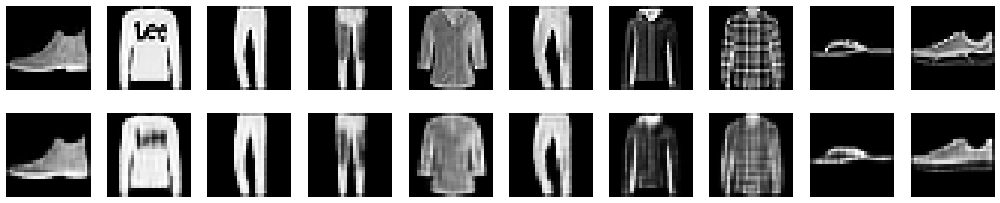

In [ ]:
import matplotlib.pyplot as plt

decoded_imgs = conv_autoencoder.predict(x_test)

n = 10
plt.figure(figsize=(20, 4))
for i in range(n):
    # original
    ax = plt.subplot(2, n, i + 1)
    plt.imshow(x_test[i].reshape(28, 28), cmap='gray')
    plt.axis('off')

    # reconstruction
    ax = plt.subplot(2, n, i + 1 + n)
    plt.imshow(decoded_imgs[i].reshape(28, 28), cmap='gray')
    plt.axis('off')
plt.show()

## 3. 3. Denoising Autoencoder

In [ ]:
# Add Gaussian noise
noise_factor = 0.4
x_train_noisy = x_train_dnz + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=x_train_dnz.shape)
x_test_noisy = x_test_dnz + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=x_test_dnz.shape)
x_train_noisy = np.clip(x_train_noisy, 0., 1.)
x_test_noisy = np.clip(x_test_noisy, 0., 1.)

# Define denoising autoencoder (same as conv autoencoder)
input_img = tf.keras.Input(shape=(28, 28, 1))

# Encoder
x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(input_img)
x = layers.MaxPooling2D((2, 2), padding='same')(x)
x = layers.Conv2D(16, (3, 3), activation='relu', padding='same')(x)
encoded = layers.MaxPooling2D((2, 2), padding='same')(x)

# Decoder
x = layers.Conv2D(16, (3, 3), activation='relu', padding='same')(encoded)
x = layers.UpSampling2D((2, 2))(x)
x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = layers.UpSampling2D((2, 2))(x)
decoded = layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)

# Model
denoising_autoencoder = models.Model(input_img, decoded)
denoising_autoencoder.compile(optimizer='adam', loss='binary_crossentropy')
denoising_autoencoder.summary()

# Train on noisy inputs, clean outputs
denoising_autoencoder.fit(x_train_noisy, x_train_dnz,
                          epochs=20,
                          batch_size=128,
                          shuffle=True,
                          validation_data=(x_test_noisy, x_test_dnz))

Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 28, 28, 1)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 28, 28, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 14, 14, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 14, 14, 16)     │         4,624 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 7, 7, 16)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 7, 7, 16)       │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_2 (UpSampling2D)  │ (None, 14, 14, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 14, 14, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_3 (UpSampling2D)  │ (None, 28, 28, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 28, 28, 1)      │           289 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 12,193 (47.63 KB)

 Trainable params: 12,193 (47.63 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
469/469 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.3991 - val_loss: 0.3038
Epoch 2/20
469/469 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 0.3000 - val_loss: 0.2990
Epoch 3/20
469/469 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.2959 - val_loss: 0.2963
Epoch 4/20
469/469 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 0.2937 - val_loss: 0.2950
Epoch 5/20
469/469 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.2920 - val_loss: 0.2935
Epoch 6/20
469/469 ━━━━━━━━━━━━━━━━━━━━ 18s 39ms/step - loss: 0.2916 - val_loss: 0.2927
Epoch 7/20
469/469 ━━━━━━━━━━━━━━━━━━━━ 18s 39ms/step - loss: 0.2896 - val_loss: 0.2916
Epoch 8/20
469/469 ━━━━━━━━━━━━━━━━━━━━ 18s 39ms/step - loss: 0.2893 - val_loss: 0.2906
Epoch 9/20
469/469 ━━━━━━━━━━━━━━━━━━━━ 18s 39ms/step - loss: 0.2891 - val_loss: 0.2899
Epoch 10/20
469/469 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 0.2879 - val_loss: 0.2898
Epoch 11/20
469/469 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.2871 - val_loss: 0.2889
Epoch 12/20
469/469 ━━━━━━━━━━

We can see visualization of denoising:

313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step


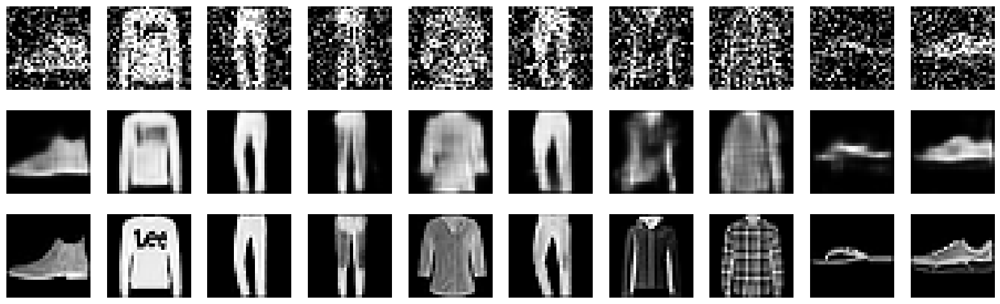

In [ ]:
# Predict
decoded_imgs = denoising_autoencoder.predict(x_test_noisy)

n = 10
plt.figure(figsize=(20, 6))
for i in range(n):
    # Noisy input
    ax = plt.subplot(3, n, i + 1)
    plt.imshow(x_test_noisy[i].reshape(28, 28), cmap='gray')
    plt.axis('off')

    # Clean reconstruction
    ax = plt.subplot(3, n, i + 1 + n)
    plt.imshow(decoded_imgs[i].reshape(28, 28), cmap='gray')
    plt.axis('off')

    # Original clean image
    ax = plt.subplot(3, n, i + 1 + 2 * n)
    plt.imshow(x_test[i].reshape(28, 28), cmap='gray')
    plt.axis('off')
plt.show()

# 4.  GAN with CIFAR-10

In [ ]:
# Load and preprocess CIFAR-10
(x_train, _), (_, _) = tf.keras.datasets.cifar10.load_data()
x_train = x_train.astype("float32") / 127.5 - 1.  # normalize to [-1, 1]
BUFFER_SIZE = 50000
BATCH_SIZE = 128

train_dataset = tf.data.Dataset.from_tensor_slices(x_train).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

170498071/170498071 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


In [ ]:
# Generator
def build_generator():
    model = tf.keras.Sequential([
        layers.Dense(8*8*256, use_bias=False, input_shape=(100,)),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Reshape((8, 8, 256)),
        layers.Conv2DTranspose(128, (5, 5), strides=(1, 1), padding='same', use_bias=False),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh')
    ])
    return model

# Discriminator
def build_discriminator():
    model = tf.keras.Sequential([
        layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[32, 32, 3]),
        layers.LeakyReLU(),
        layers.Dropout(0.3),
        layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'),
        layers.LeakyReLU(),
        layers.Dropout(0.3),
        layers.Flatten(),
        layers.Dense(1)
    ])
    return model

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1, Gen Loss: 1.7944, Disc Loss: 0.8485


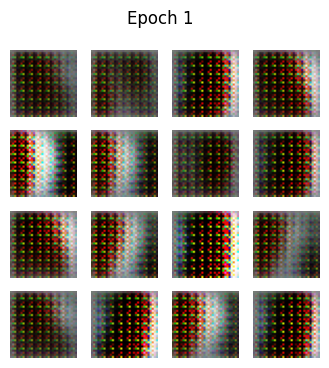

Epoch 2, Gen Loss: 1.3019, Disc Loss: 0.8516


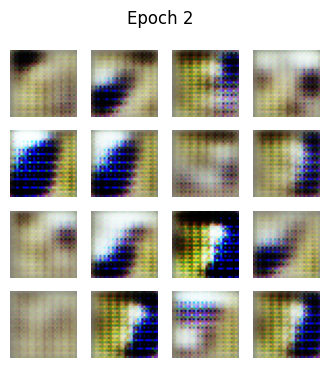

Epoch 3, Gen Loss: 1.2794, Disc Loss: 1.0114


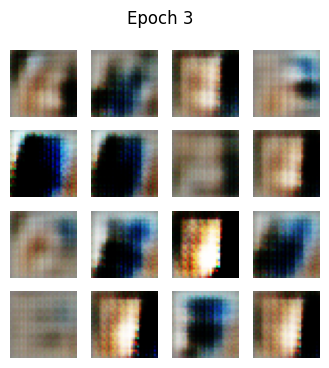

Epoch 4, Gen Loss: 1.9576, Disc Loss: 0.7899


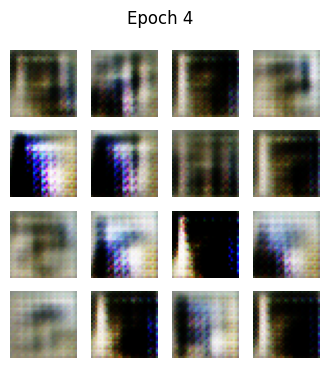

Epoch 5, Gen Loss: 1.3072, Disc Loss: 0.9762


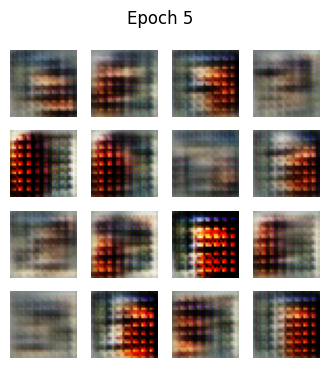

Epoch 6, Gen Loss: 1.4472, Disc Loss: 0.8903


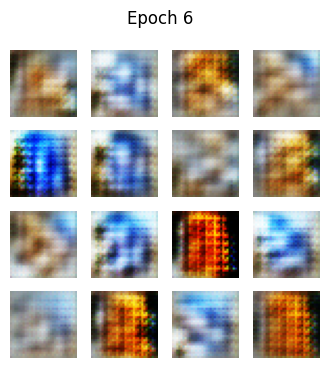

Epoch 7, Gen Loss: 1.4911, Disc Loss: 1.1227


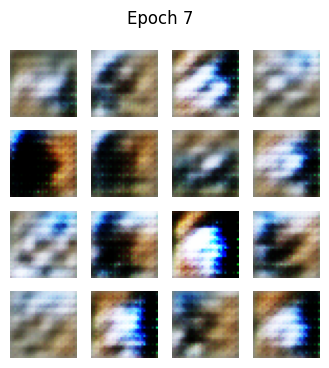

Epoch 8, Gen Loss: 1.4557, Disc Loss: 0.9925


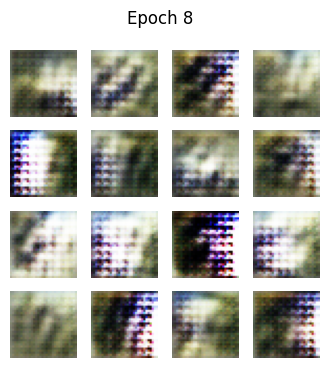

Epoch 9, Gen Loss: 1.4282, Disc Loss: 0.8562


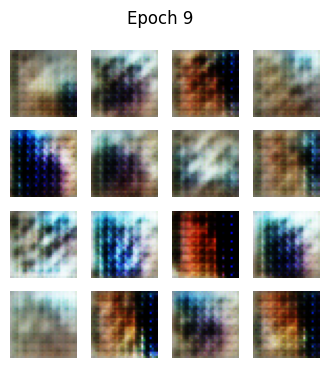

Epoch 10, Gen Loss: 1.2518, Disc Loss: 1.0724


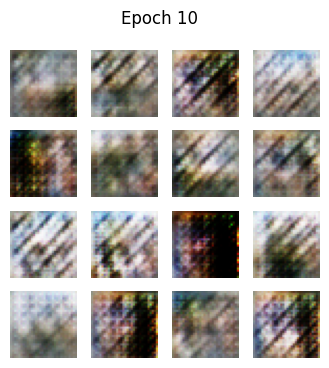

Epoch 11, Gen Loss: 0.9433, Disc Loss: 1.2833


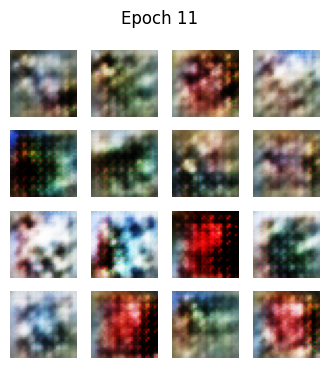

Epoch 12, Gen Loss: 1.5434, Disc Loss: 0.9283


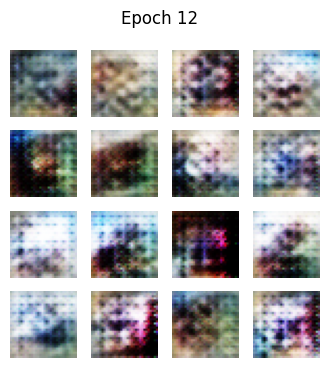

Epoch 13, Gen Loss: 1.1421, Disc Loss: 1.3542


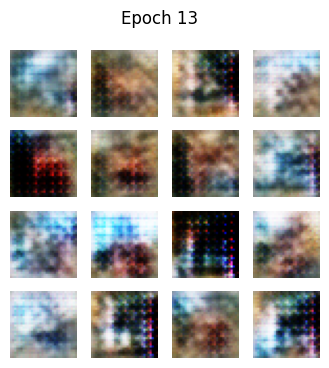

Epoch 14, Gen Loss: 0.9045, Disc Loss: 1.4355


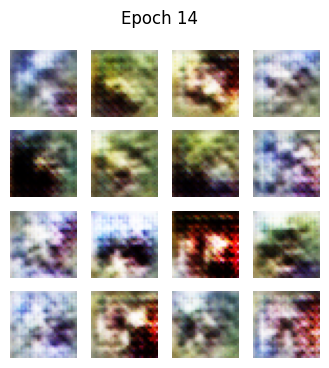

Epoch 15, Gen Loss: 0.8580, Disc Loss: 1.4998


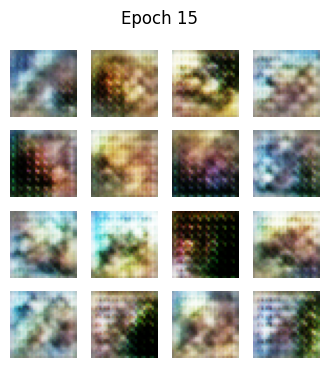

Epoch 16, Gen Loss: 1.1338, Disc Loss: 1.2009


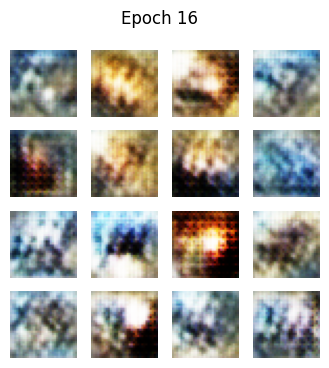

Epoch 17, Gen Loss: 1.1238, Disc Loss: 1.1133


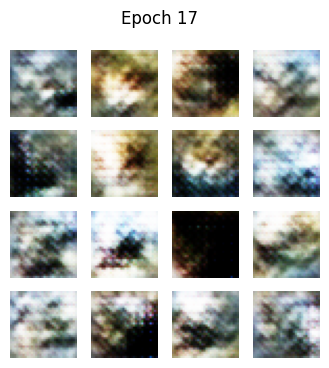

Epoch 18, Gen Loss: 1.2089, Disc Loss: 1.2220


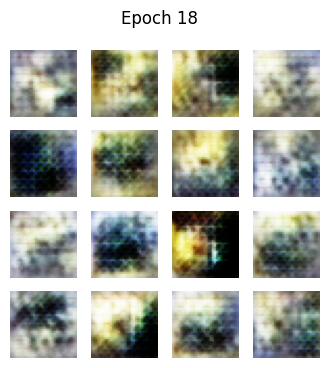

Epoch 19, Gen Loss: 0.7786, Disc Loss: 1.4051


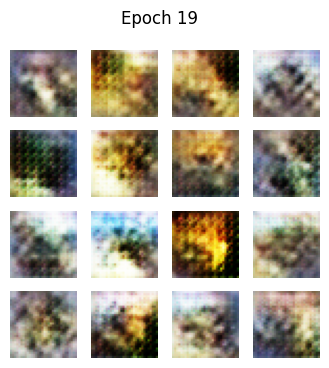

Epoch 20, Gen Loss: 1.3301, Disc Loss: 1.0626


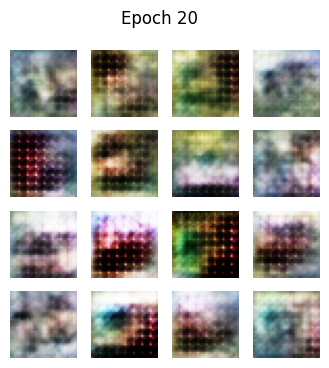

Epoch 21, Gen Loss: 1.2963, Disc Loss: 0.9337


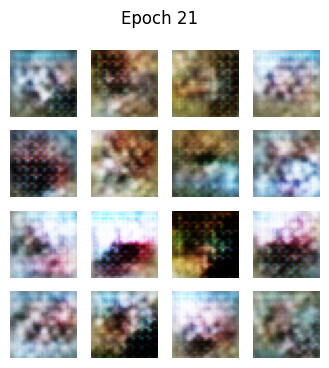

Epoch 22, Gen Loss: 1.0712, Disc Loss: 1.1717


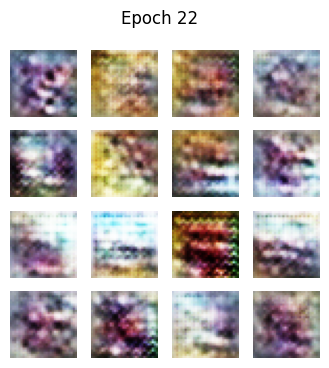

Epoch 23, Gen Loss: 0.7905, Disc Loss: 1.3028


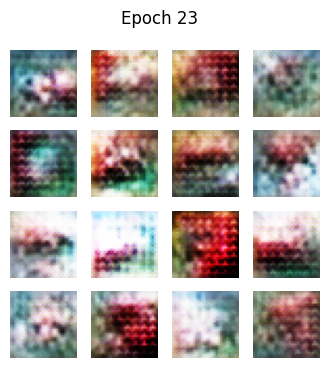

Epoch 24, Gen Loss: 1.2493, Disc Loss: 1.0168


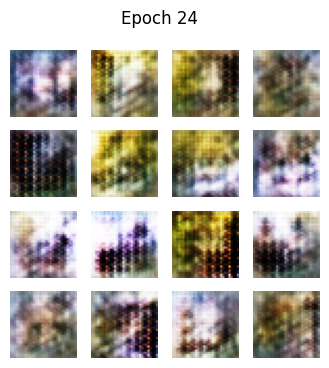

Epoch 25, Gen Loss: 1.2379, Disc Loss: 0.9508


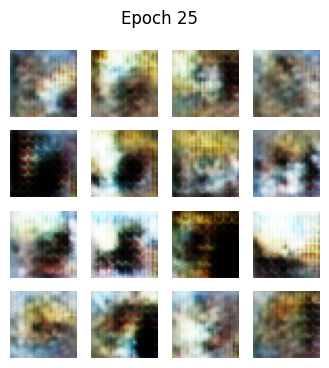

Epoch 26, Gen Loss: 1.0619, Disc Loss: 1.0202


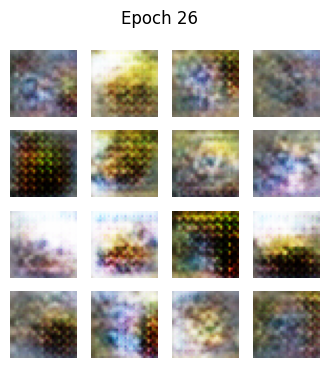

Epoch 27, Gen Loss: 1.4933, Disc Loss: 0.9553


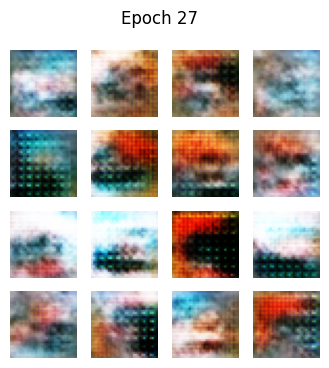

Epoch 28, Gen Loss: 0.9911, Disc Loss: 1.2419


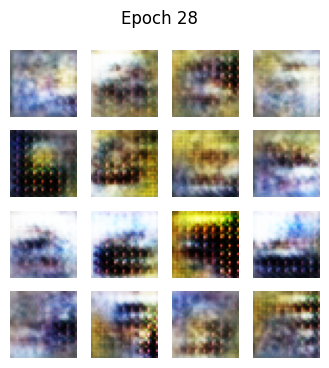

Epoch 29, Gen Loss: 0.9568, Disc Loss: 1.2026


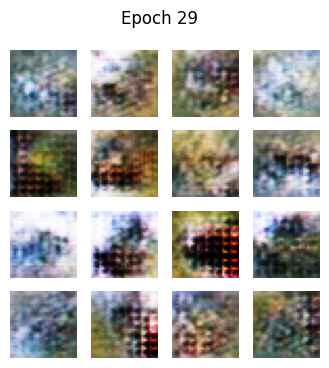

Epoch 30, Gen Loss: 1.0708, Disc Loss: 1.1019


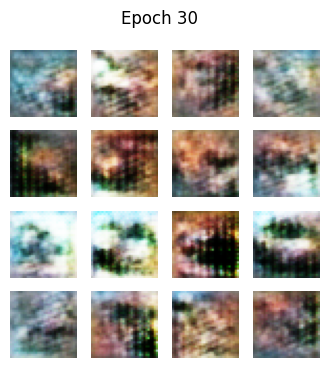

Epoch 31, Gen Loss: 0.9398, Disc Loss: 1.1920


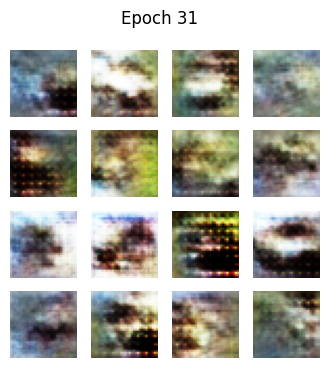

Epoch 32, Gen Loss: 1.2138, Disc Loss: 1.0401


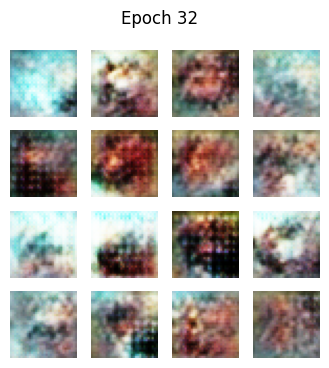

Epoch 33, Gen Loss: 1.4217, Disc Loss: 0.8696


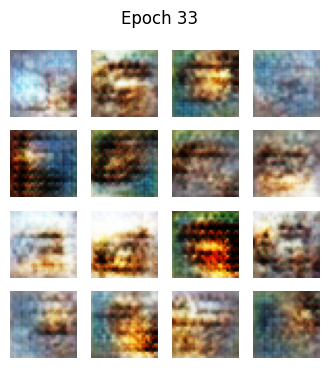

Epoch 34, Gen Loss: 1.4150, Disc Loss: 1.2699


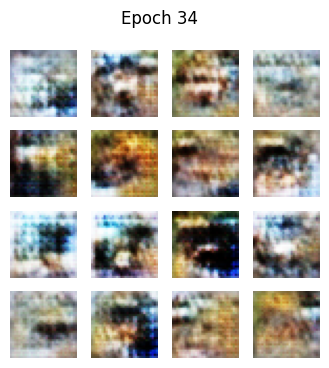

Epoch 35, Gen Loss: 1.2526, Disc Loss: 1.1894


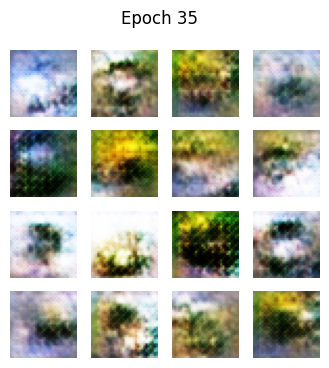

Epoch 36, Gen Loss: 1.0630, Disc Loss: 1.3387


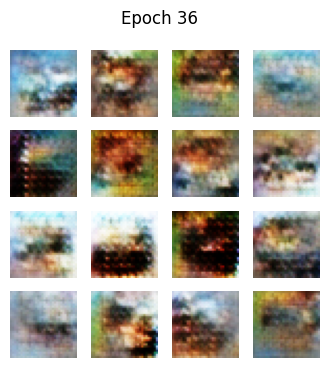

Epoch 37, Gen Loss: 1.4344, Disc Loss: 0.9423


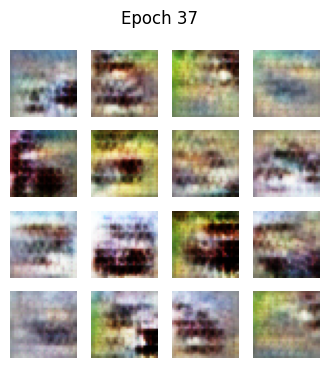

Epoch 38, Gen Loss: 0.9810, Disc Loss: 1.2283


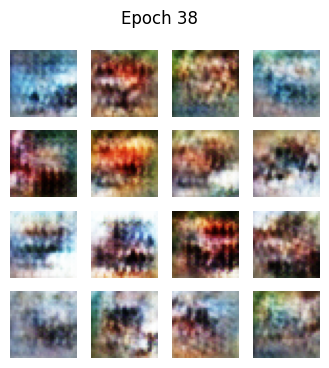

Epoch 39, Gen Loss: 1.2880, Disc Loss: 1.1566


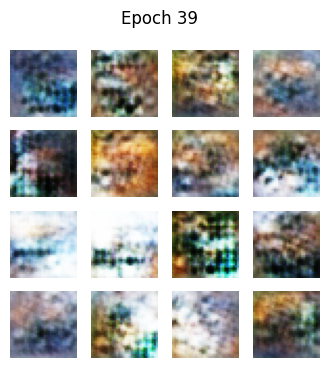

Epoch 40, Gen Loss: 1.0499, Disc Loss: 1.4087


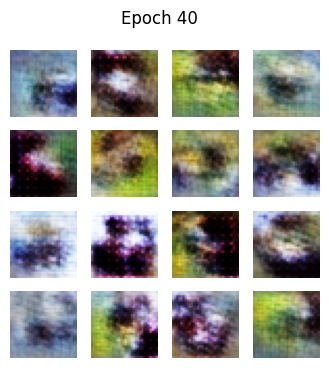

Epoch 41, Gen Loss: 1.2241, Disc Loss: 1.4052


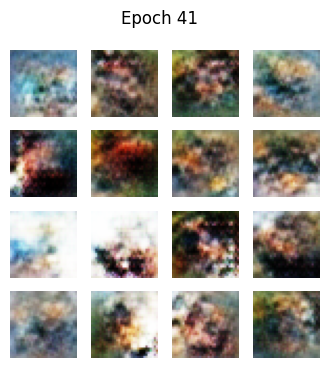

Epoch 42, Gen Loss: 1.0044, Disc Loss: 1.4355


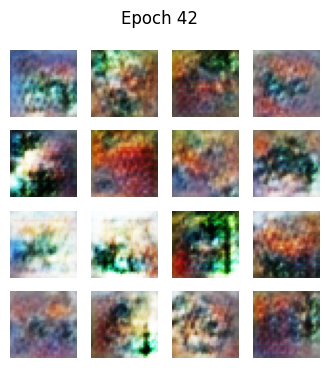

Epoch 43, Gen Loss: 1.0832, Disc Loss: 1.1222


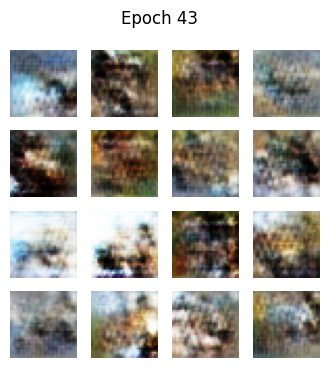

Epoch 44, Gen Loss: 1.0106, Disc Loss: 1.4578


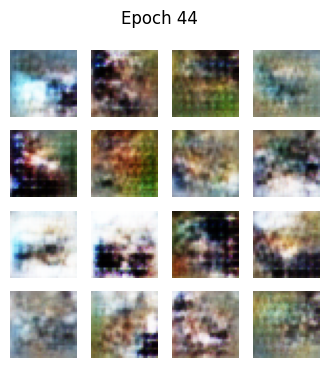

Epoch 45, Gen Loss: 1.3032, Disc Loss: 0.9796


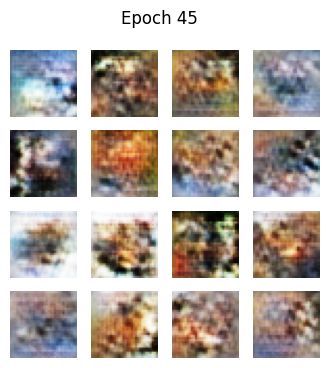

Epoch 46, Gen Loss: 1.0260, Disc Loss: 1.2192


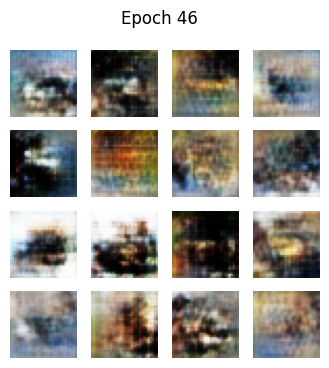

Epoch 47, Gen Loss: 1.5150, Disc Loss: 0.9235


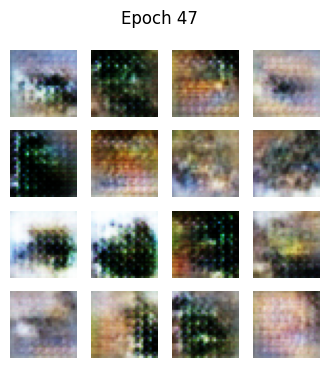

Epoch 48, Gen Loss: 0.9420, Disc Loss: 1.2440


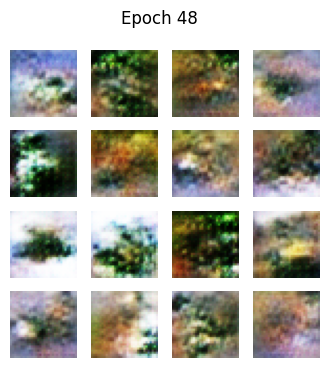

Epoch 49, Gen Loss: 1.1171, Disc Loss: 1.0818


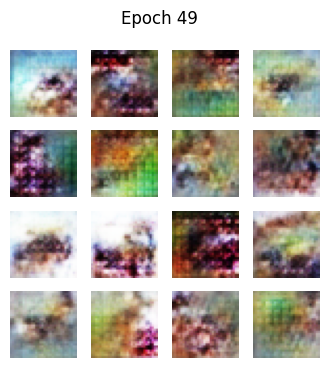

Epoch 50, Gen Loss: 1.0529, Disc Loss: 1.0909


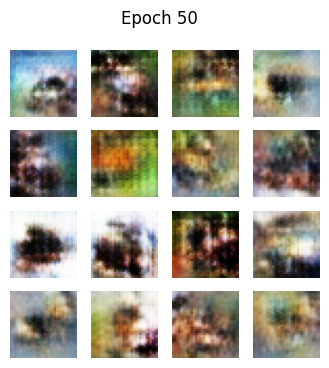

In [ ]:
# Create models
generator = build_generator()
discriminator = build_discriminator()

# Loss and optimizers
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real_output, fake_output):
    return cross_entropy(tf.ones_like(real_output), real_output) + \
           cross_entropy(tf.zeros_like(fake_output), fake_output)

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

# Training loop
EPOCHS = 50
noise_dim = 100
num_examples_to_generate = 16
seed = tf.random.normal([num_examples_to_generate, noise_dim])

@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, noise_dim])
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)
        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)
        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
    return gen_loss, disc_loss

def generate_and_plot_images(model, epoch, test_input):
    predictions = model(test_input, training=False)
    predictions = (predictions + 1) / 2.0
    fig = plt.figure(figsize=(4, 4))
    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i + 1)
        plt.imshow(predictions[i])
        plt.axis('off')
    plt.suptitle(f"Epoch {epoch}")
    plt.show()

def train(dataset, epochs):
    for epoch in range(1, epochs + 1):
        for image_batch in dataset:
            gen_loss, disc_loss = train_step(image_batch)
        print(f"Epoch {epoch}, Gen Loss: {gen_loss.numpy():.4f}, Disc Loss: {disc_loss.numpy():.4f}")
        generate_and_plot_images(generator, epoch, seed)

# Start training
train(train_dataset, EPOCHS)

# 5. OpenAI

Problem With API Quota :(((

# 6. Variational AutoEncoder (VAE)

Epoch 1, Loss: 285.4423
Epoch 2, Loss: 256.1294
Epoch 3, Loss: 250.6428
Epoch 4, Loss: 247.8540
Epoch 5, Loss: 246.1569
Epoch 6, Loss: 245.0018
Epoch 7, Loss: 244.2215
Epoch 8, Loss: 243.6392
Epoch 9, Loss: 243.1537
Epoch 10, Loss: 242.7174


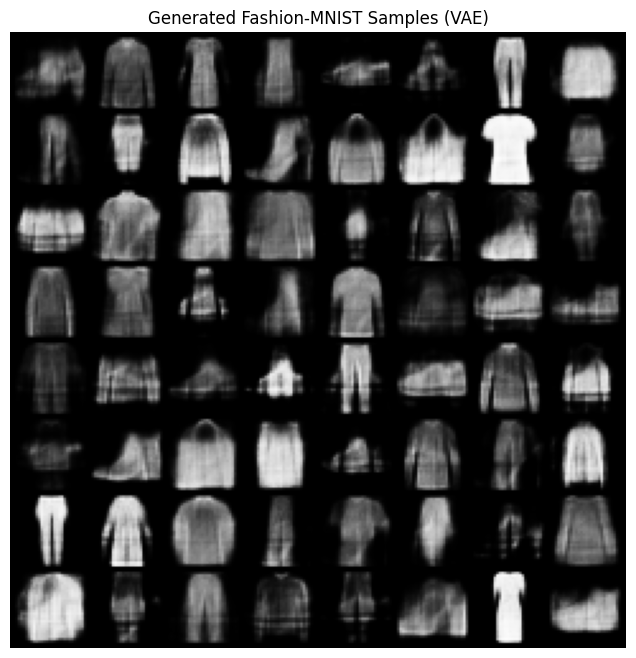

In [4]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load Fashion MNIST dataset
transform = transforms.ToTensor()
train_dataset = datasets.FashionMNIST(root="./data", train=True, transform=transform, download=True)
train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)

# VAE architecture
class VAE(nn.Module):
    def __init__(self):
        super(VAE, self).__init__()
        self.fc1 = nn.Linear(28*28, 400)
        self.fc21 = nn.Linear(400, 20)  # mu
        self.fc22 = nn.Linear(400, 20)  # logvar
        self.fc3 = nn.Linear(20, 400)
        self.fc4 = nn.Linear(400, 28*28)

    def encode(self, x):
        h1 = torch.relu(self.fc1(x))
        return self.fc21(h1), self.fc22(h1)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def decode(self, z):
        h3 = torch.relu(self.fc3(z))
        return torch.sigmoid(self.fc4(h3))

    def forward(self, x):
        mu, logvar = self.encode(x.view(-1, 28*28))
        z = self.reparameterize(mu, logvar)
        return self.decode(z), mu, logvar

# Loss function
def loss_function(recon_x, x, mu, logvar):
    BCE = nn.functional.binary_cross_entropy(recon_x, x.view(-1, 28*28), reduction='sum')
    KLD = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
    return BCE + KLD

# Initialize model and optimizer
model = VAE().to(device)
optimizer = optim.Adam(model.parameters(), lr=1e-3)

# Training loop
epochs = 10
model.train()
for epoch in range(epochs):
    train_loss = 0
    for batch_idx, (data, _) in enumerate(train_loader):
        data = data.to(device)
        optimizer.zero_grad()
        recon_batch, mu, logvar = model(data)
        loss = loss_function(recon_batch, data, mu, logvar)
        loss.backward()
        train_loss += loss.item()
        optimizer.step()

    print(f"Epoch {epoch + 1}, Loss: {train_loss / len(train_loader.dataset):.4f}")

# Generate new samples
model.eval()
with torch.no_grad():
    z = torch.randn(64, 20).to(device)
    sample = model.decode(z).cpu()
    sample = sample.view(64, 1, 28, 28)

# Show generated images
grid = torchvision.utils.make_grid(sample, nrow=8)
plt.figure(figsize=(8, 8))
plt.imshow(grid.permute(1, 2, 0).squeeze())
plt.axis('off')
plt.title("Generated Fashion-MNIST Samples (VAE)")
plt.show()

# 7. Explain the process of adversarial learning in a few sentences.

✅ Answer:

 `Adversarial learning is like a game between two AI models — one’s the faker (called the generator) and the other’s the detective (the discriminator). The faker tries to make fake stuff (like images) that look real, and the detective tries to catch the fake. At first, the faker isn’t very good, but over time, it gets better at fooling the detective. And the detective also gets better at spotting the fakes. They keep challenging each other until the faker gets so good that even the detective can’t tell what’s real and what’s not. That’s basically how GANs work!`